# Stitching Mueller Matriz

In [ ]:
pip install stitching

# Librerías

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import imageio as img
import cv2
import matplotlib as mpl
import matplotlib.font_manager as fm
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from stitching import Stitcher
from stitching.subsetter import Subsetter
from stitching.images import Images
from stitching.feature_detector import FeatureDetector
from stitching.feature_matcher import FeatureMatcher
from stitching.subsetter import Subsetter
from stitching.camera_estimator import CameraEstimator
from stitching.camera_adjuster import CameraAdjuster
from stitching.camera_wave_corrector import WaveCorrector
from stitching.warper import Warper
from stitching.timelapser import Timelapser
from stitching.cropper import Cropper
from stitching.seam_finder import SeamFinder
from stitching.exposure_error_compensator import ExposureErrorCompensator
from stitching.blender import Blender
from scipy.ndimage import gaussian_filter
from skimage.metrics import structural_similarity as ssim, mean_squared_error, normalized_root_mse
import glob
import fnmatch
from PIL import Image
import os
import cv2
from google.colab.patches import cv2_imshow
import pickle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/DATASET/DenseConnective
dir_dataset = '/content/drive/MyDrive/DATASET/'

Mounted at /content/drive
/content/drive/MyDrive/DATASET/DenseConnective


# Stitching Funciones

In [ ]:
MAX16 = 2**16-1
MAX8 = 2**8-1

def subsetter(images, medium_imgs, low_imgs, final_imgs, confidence_threshold, indices):

  #Subconjuntos
  subsetter = Subsetter(confidence_threshold=confidence_threshold,
                        matches_graph_dot_file=None)

  medium_imgs = subsetter.subset_list(medium_imgs, indices)
  low_imgs = subsetter.subset_list(low_imgs, indices)
  final_imgs = subsetter.subset_list(final_imgs, indices)

  return images, medium_imgs, low_imgs, final_imgs


def flip_horizontal(img):
  """Flips an image horizontally.

  Args:
    img: A NumPy array representing the image.

  Returns:
    A NumPy array representing the flipped image.
  """
  height, width = img.shape[:2]
  half_width = width // 2

  left_half = img[:, :half_width]
  right_half = img[:, half_width:]

  flipped_img = np.concatenate((right_half, left_half), axis=1)

  return flipped_img

def composePanoramic(cameras, images, medium_imgs, low_imgs, final_imgs, crop=True, plots=False):

  #Warper
  warper = Warper(warper_type='plane')

  warper.set_scale(cameras)

  low_sizes = images.get_scaled_img_sizes(Images.Resolution.LOW)
  camera_aspect = images.get_ratio(Images.Resolution.MEDIUM, Images.Resolution.LOW)  # since cameras were obtained on medium imgs

  warped_low_imgs = list(warper.warp_images(low_imgs, cameras, camera_aspect))
  warped_low_masks = list(warper.create_and_warp_masks(low_sizes, cameras, camera_aspect))
  low_corners, low_sizes = warper.warp_rois(low_sizes, cameras, camera_aspect)

  final_sizes = images.get_scaled_img_sizes(Images.Resolution.FINAL)
  camera_aspect = images.get_ratio(Images.Resolution.MEDIUM, Images.Resolution.FINAL)

  warped_final_imgs = list(warper.warp_images(final_imgs, cameras, camera_aspect))
  warped_final_masks = list(warper.create_and_warp_masks(final_sizes, cameras, camera_aspect))
  final_corners, final_sizes = warper.warp_rois(final_sizes, cameras, camera_aspect)

  #Costura
  seam_finder = SeamFinder()

  seam_masks = seam_finder.find(warped_low_imgs, low_corners, warped_low_masks)
  seam_masks = [seam_finder.resize(seam_mask, mask) for seam_mask, mask in zip(seam_masks, warped_final_masks)]

  seam_masks_plots = [SeamFinder.draw_seam_mask(img, seam_mask) for img, seam_mask in zip(warped_final_imgs, seam_masks)]

  #Compensador exposición
  compensator = ExposureErrorCompensator(compensator = "no")

  compensator.feed(low_corners, warped_low_imgs, warped_low_masks)

  compensated_imgs = [compensator.apply(idx, corner, img, mask)
                      for idx, (img, mask, corner)
                      in enumerate(zip(warped_final_imgs, warped_final_masks, final_corners))]

  blender = Blender()
  blender.prepare(final_corners, final_sizes)
  for img, mask, corner in zip(compensated_imgs, seam_masks, final_corners):
      blender.feed(img, mask, corner)
  panorama, _ = blender.blend()

  return panorama

def create_mueller_dataset(img_list, component=1):
    # Recorta las componente indicada de la matriz de mueller png
    # component = -1 para crear todos los ds
    # componentes de 1 a 9 (izq sup a der inf)

    mueller = png2mueller(cv2.imread(img_list[0]),'M16')

    M, N = mueller.shape[0], mueller.shape[1]  # ancho y alto componentes
    print(N,M)
    output_dir = 'crops/'

    # Crea el directorio de salida si no existe
    os.makedirs(output_dir, exist_ok=True)

    # Crea una lista para almacenar las imágenes recortadas
    mueller_dataset_img, mueller_img_list = [], []

    for img in img_list:
        # Abre la imagen
        imagen = Image.open(img)
        rect_size = (N, M)

        # Verifica si se desea recortar todos los componentes o uno específico
        if component == -1:
            # Recorta la imagen en 9 rectángulos iguales
            for fila in range(3):
                for col in range(3):
                    left = col * rect_size[0]
                    upper = fila * rect_size[1]
                    right = left + rect_size[0]
                    lower = upper + rect_size[1]

                    # Recorta y almacena cada rectángulo en la lista
                    recorte = imagen.crop((left, upper, right, lower))
                    mueller_dataset_img.append(np.array(recorte))
                    saved_image_name = f'comp_all_{len(mueller_dataset_img)}.png'
                    saved_image_path = os.path.join(output_dir, saved_image_name)
                    recorte.save(saved_image_path, 'PNG')
                    mueller_img_list.append(saved_image_path)

        elif component >= 1 and component <= 9:
            # Calcula las coordenadas del recorte para el componente deseado
            row = (component - 1) // 3
            col = (component - 1) % 3
            left = col * rect_size[0]
            upper = row * rect_size[1]
            right = left + rect_size[0]
            lower = upper + rect_size[1]

            # Recorta y almacena solo el componente deseado
            recorte = imagen.crop((left, upper, right, lower))
            mueller_dataset_img.append(np.array(recorte))
            saved_image_name = f'comp_{component}_{len(mueller_dataset_img)}.png'
            saved_image_path = os.path.join(output_dir, saved_image_name)
            recorte.save(saved_image_path, 'PNG')
            mueller_img_list.append(saved_image_path)

        # Cierra la imagen original
        imagen.close()

    return mueller_dataset_img, mueller_img_list

def cargar_imgs(dir_dataset,  tipo, muestra, medida):
  if muestra == None:
    dir = dir_dataset + tipo + '/'+ medida + '/'
  else:
    dir = dir_dataset + tipo + '/'+ muestra + '/' + medida + '/'
  # Patrón para buscar archivos PNG
  patron = '*.png'
  print(dir)

  # Crear una lista de imágenes excluyendo el patrón especificado
  img_list = [archivo for archivo in glob.glob(f'{dir}{patron}')]

  return sorted(img_list)

def pre_mueller_comp(img_list, stitching_config, indices = None, train=True, cmap_jet = False, plots = False):
  #Configuración
  medium_megapix = stitching_config['medium_megapix']
  low_megapix = stitching_config['low_megapix']
  final_megapix = stitching_config['final_megapix']
  detector = stitching_config['detector']
  nfeatures = stitching_config['nfeatures']
  confidence_threshold = stitching_config['confidence_threshold']

  #Preprocesamiento
  images, medium_imgs, low_imgs, final_imgs, original_size, medium_size, low_size, final_size = preprocessImages(img_list, medium_megapix, low_megapix, final_megapix)

  #Entrenamiento
  if train:
    cameras, indices, images, medium_imgs, low_imgs, final_imgs = findFeatures(images, medium_imgs, low_imgs, final_imgs, original_size, medium_size, low_size, final_size , detector, nfeatures, confidence_threshold, cmap_jet = cmap_jet, plots = plots)
    return cameras, indices, images, medium_imgs, low_imgs, final_imgs

  #Test
  else:
    images, medium_imgs, low_imgs, final_imgs = subsetter(images, medium_imgs, low_imgs, final_imgs, confidence_threshold, indices)
    return images, medium_imgs, low_imgs, final_imgs


def plot_image(img, figsize_in_inches=(5,5)):
    fig, ax = plt.subplots(figsize=figsize_in_inches)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    #ax.imshow(img[:,:,1],cmap='jet')
    plt.show()

# prompt: Forget about the previous function. Now make a function that crops an image into N overlapping rectangles. Rectangles must start in top left and advance towards bottom right moving to the right and then down (raster scan movement). Rectangles must be 800x600. I

def crop_image_overlapping_rectangles(path_to_img, output_path, alfa):

  #Leer imagen
  image = cv2.imread(path_to_img)

  #Tamaño mínimo rect size
  X = image.shape[0]//2
  Y = image.shape[1]//2

  #Crop
  x1 = int(X*(1+alfa))
  y1 = int(Y*(1+alfa))
  crop1 = image[0:x1, 0:y1]
  x2 = int(X*(1+alfa))
  y2 = int(Y*(1-alfa))
  crop2 = image[0:x2, y2:2*Y]
  x3 = int(X*(1-alfa))
  y3 = int(Y*(1+alfa))
  crop3 = image[x3:2*X, 0:y3]
  x4 = int(X*(1-alfa))
  y4 = int(Y*(1-alfa))
  crop4 = image[x4:2*X, y4:2*Y]

  #Lista
  cropped_images = [crop1, crop2, crop3, crop4]

  #Guardar
  for count, cropped_img in enumerate(cropped_images):
      name = 'splitted'
      frmt = 'jpeg'
      cv2.imwrite(f'{output_path}/{name}_{count}.{frmt}', cropped_img)

  return cropped_images

def preprocessImages(imgs_list, medium_megapix = 0.6, low_megapix = 0.1, final_megapix = -1):

  images = Images.of(imgs_list)

  medium_imgs = list(images.resize(Images.Resolution.MEDIUM))
  low_imgs = list(images.resize(Images.Resolution.LOW))
  final_imgs = list(images.resize(Images.Resolution.FINAL))

  #Tamaño imágenes
  original_size = images.sizes[0]
  medium_size = images.get_image_size(medium_imgs[0])
  low_size = images.get_image_size(low_imgs[0])
  final_size = images.get_image_size(final_imgs[0])

  return images, medium_imgs, low_imgs, final_imgs, original_size, medium_size, low_size, final_size

def findFeatures(images, medium_imgs, low_imgs, final_imgs, original_size, medium_size, low_size, final_size, detector = 'sift', nfeatures = 1000, confidence_threshold=0.9, cmap_jet = False, plots = False):

  #Features
  finder = FeatureDetector(detector = detector,
                           nfeatures = nfeatures)

  features = [finder.detect_features(img) for img in medium_imgs[::-1]]

  if cmap_jet:
    medium_imgs = [cv2.applyColorMap(img[:,:,1], cv2.COLORMAP_JET) for img in medium_imgs]

  for idx, img in enumerate(medium_imgs):
    keypoints_center_img = finder.draw_keypoints(img, features[idx])

    # if plots:
    #   plot_image(keypoints_center_img, (15,10))
    #   print(f"Len FEATURES: {len(features[idx].keypoints)}")

  for img in medium_imgs:
    img = cv2.applyColorMap(img[:,:,1], cv2.COLORMAP_JET)

  #Matching
  matcher = FeatureMatcher(matcher_type='homography', range_width=-1)

  matches = matcher.match_features(features)
  all_relevant_matches = matcher.draw_matches_matrix(medium_imgs[::-1], features, matches, conf_thresh=1,
                                                   inliers=True, matchColor=(255, 0, 0))

  for idx1, idx2, img in all_relevant_matches:

      # inliers = match.getInliers()
      # num_inliers = len(inliers)
      # print(f"Number of matches inliers image {idx1} and image {idx2}: {num_inliers}")

      # keypoints1 = features[idx1].getKeypoints()
      # keypoints2 = features[idx2].getKeypoints()
      # matches = match.getMatches()

      # drawimg =  cv2.drawMatches(
      #       medium_imgs[idx1], keypoints1, medium_imgs[idx2], keypoints2, matches, None)

      # plot_image(drawimg, (20,10))
      if plots:
        print(f"Matches Image {idx1+1} to Image {idx2+1}")

        matches_matrix = FeatureMatcher.get_matches_matrix(matches)
        matche = matches_matrix[idx1, idx2]
        if matche.confidence < 1 or len(matche.matches) == 0:
          continue
        num_matches =len(matche.getMatches())
        print(f"Number of matches between image {idx1} and image {idx2}: {num_matches}")

        plot_image(img, (20,10))

  #Subconjuntos
  subsetter = Subsetter(confidence_threshold=confidence_threshold,
                        matches_graph_dot_file=None)

  indices = subsetter.get_indices_to_keep(features, matches)

  medium_imgs = subsetter.subset_list(medium_imgs, indices)
  low_imgs = subsetter.subset_list(low_imgs, indices)
  final_imgs = subsetter.subset_list(final_imgs, indices)
  features = subsetter.subset_list(features, indices)
  matches = subsetter.subset_matches(matches, indices)

  img_names = subsetter.subset_list(images.names, indices)
  img_sizes = subsetter.subset_list(images.sizes, indices)
  images.img_names, images.img_sizes = img_names, img_sizes

  #Camaras
  camera_estimator = CameraEstimator(estimator='homography')

  camera_adjuster = CameraAdjuster(adjuster='ray', refinement_mask='xxxxx')

  wave_corrector = WaveCorrector(wave_correct_kind='no')

  cameras = camera_estimator.estimate(features, matches)
  cameras = camera_adjuster.adjust(features, matches, cameras)
  cameras = wave_corrector.correct(cameras)

  return cameras, indices, images, medium_imgs, low_imgs, final_imgs

def filtrar_lista(lista_imgs, indices):
  lista_imgs_filtered = lista_imgs.copy()
  for i in sorted(indices, reverse = True):
    del lista_imgs_filtered[i]
  return lista_imgs_filtered

def split_image_modified(path_to_img, split_width, split_height, output_path, overlap=0):
    img = cv2.imread(path_to_img)
    img_h, img_w, _ = img.shape

    #Solo funciona para imagenes 612 x 512 con overlap entre 0 y 0.5
    new_height = img_h + int(512+2*512*(1-overlap)-1024)-2
    new_width = img_w + int(612+2*612*(1-overlap)-1224)-2

    print(new_height)
    print(new_width)

    # Crea una nueva imagen negra con las dimensiones ampliadas
    black_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)

    # Calcula las coordenadas para centrar la imagen original
    y_offset = int((new_height - img_h) / 2)
    x_offset = int((new_width - img_w) / 2)

    # Copia la imagen original en el centro de la imagen negra
    black_image[y_offset:y_offset+img_h, x_offset:x_offset+img_w, :] = img

    def start_points(size, split_size, overlap=0):
        points = [0]
        stride = int(split_size * (1 - overlap))
        counter = 1
        while True:
            pt = stride * counter
            if pt + split_size >= size:
                if split_size == size:
                    break
                points.append(size - split_size)
                break
            else:
                points.append(pt)
            counter += 1
        return points

    X_points = start_points(new_width, split_width, overlap)
    Y_points = start_points(new_height, split_height, overlap)

    cropped_images = []

    for i in Y_points:
        for j in X_points:
            split = black_image[i:i + split_height, j:j + split_width]
            cropped_images.append(split)

    # Guardar imágenes recortadas si es necesario
    for count, cropped_img in enumerate(cropped_images):
        name = 'splitted'
        frmt = 'jpeg'
        cv2.imwrite(f'{output_path}/{name}_{count}.{frmt}', cropped_img)

    # Imprime cantidad de imágenes
    print(f'Cantidad de imágenes: {len(cropped_images)}')

    return cropped_images

def compare_images(original_img, stitched_img, plots):

    # Dimensiones
    desired_width = 1224
    desired_height = 1024

    # Convertir imágenes a escala de grises
    original_gs = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)
    stitched_gs = cv2.cvtColor(stitched_img, cv2.COLOR_BGR2GRAY)

    # Calcular la correlación cruzada
    corr = cv2.matchTemplate(stitched_gs, original_gs, cv2.TM_CCORR_NORMED)

    # Encontrar la ubicación de la máxima correlación
    _, _, _, max_loc = cv2.minMaxLoc(corr)

    # Recortar las imágenes para que tengan el mismo tamaño
    stitched_cropped = stitched_img[max_loc[1]:max_loc[1] + original_img.shape[0], max_loc[0]:max_loc[0] + original_img.shape[1]]
    original_cropped = original_img[0:original_img.shape[0], 0:original_img.shape[1]]

    # Calcula las dimensiones de los bordes a agregar
    top = (desired_height - stitched_cropped.shape[0]) // 2
    bottom = desired_height - stitched_cropped.shape[0] - top
    left = (desired_width - stitched_cropped.shape[1]) // 2
    right = desired_width - stitched_cropped.shape[1] - left

    # Crea una nueva imagen negra con las dimensiones deseadas
    black_image = np.zeros((desired_height, desired_width, 3), dtype=np.uint8)

    # Copia la imagen panorámica en el centro de la nueva imagen
    black_image[top:top + stitched_cropped.shape[0], left:left + stitched_cropped.shape[1], :] = stitched_cropped

    # Panorámica ajustada
    stitched_cropped = black_image

    # Convertir las imágenes recortadas a escala de grises para el cálculo de métricas
    stitched_cropped_gs = cv2.cvtColor(stitched_cropped, cv2.COLOR_BGR2GRAY)
    original_cropped_gs = cv2.cvtColor(original_cropped, cv2.COLOR_BGR2GRAY)

    # Calcular el MSE
    mse_value = mean_squared_error(stitched_cropped_gs, original_cropped_gs)

    # Calcular el NRMSE
    nrmse_value = normalized_root_mse(stitched_cropped_gs, original_cropped_gs)

    # Calcular el SSIM
    ssim_value, _ = ssim(stitched_cropped_gs, original_cropped_gs, full=True)

    # Mostrar las imágenes recortadas
    if plots:
      plt.figure(figsize=(10, 5))
      plt.subplot(1, 2, 1)
      plt.title("Imagen Original Recortada")
      plt.imshow(original_cropped)
      plt.axis('off')

      plt.subplot(1, 2, 2)
      plt.title("Imagen Stitcheada Recortada")
      plt.imshow(stitched_cropped)
      plt.axis('off')

      plt.show()

    # Devolver las métricas
    return mse_value, ssim_value, nrmse_value

# Mueller Funciones

In [ ]:
def calcular_y_guardar_propiedad(img_list, dir_output, name, medida='M16', propiedad = np.linalg.det, *args, **kwargs):
  for img_n in img_list:
    #Cargar imagen
    img = cv2.imread(img_n, -1)

    #Convertir a Matriz de Mueller
    M = png2mueller(img, 'M16')

    ##########Calculo propiedad##############
    prop = propiedad(M,*args,**kwargs);
    ##########################################
    #Guarda
    dir_prop = os.path.join(dir_output, name)
    if not os.path.exists(dir_prop):
      os.makedirs(dir_prop)
    cv2.imwrite(dir_output+name+'/'+img_n[-6:], digitalizar(prop, medida))
  return prop

def acoplar_mueller(M):
  M_show = M.copy()
  M1_show = np.append(M_show[:,:,0,0], M_show[:,:,0,1], axis=1)
  M1_show = np.append(M1_show, M_show[:,:,0,2], axis=1)
  M2_show = np.append(M_show[:,:,1,0], M_show[:,:,1,1], axis=1)
  M2_show = np.append(M2_show, M_show[:,:,1,2], axis=1)
  M3_show = np.append(M_show[:,:,2,0], M_show[:,:,2,1], axis=1)
  M3_show = np.append(M3_show, M_show[:,:,2,2], axis=1)
  M_show = np.append(M1_show, M2_show, axis = 0)
  M_show = np.append(M_show, M3_show, axis = 0)
  return M_show

def acoplar_mueller_canal(M):
  M_show = M.copy()
  M1_show = np.append(M_show[:,:,0,0], M_show[:,:,0,1], axis=1)
  M1_show = np.append(M1_show, M_show[:,:,0,2], axis=1)
  M2_show = np.append(M_show[:,:,1,0], M_show[:,:,1,1], axis=1)
  M2_show = np.append(M2_show, M_show[:,:,1,2], axis=1)
  M3_show = np.append(M_show[:,:,2,0], M_show[:,:,2,1], axis=1)
  M3_show = np.append(M3_show, M_show[:,:,2,2], axis=1)
  M_show = np.append(M1_show, M2_show, axis = 0)
  M_show = np.append(M_show, M3_show, axis = 0)
  return M_show

def desacoplar_mueller(M_show):
  M = np.zeros((M_show.shape[0]//3,M_show.shape[1]//3,3,3,3),dtype=float)
  Y_shape = M_show.shape[0]//3
  X_shape = M_show.shape[1]//3
  for i in range(3):
    for j in range(3):
      for k in range(3):
        M[:,:,k,i,j] = M_show[i*Y_shape:(i+1)*Y_shape,j*X_shape:(j+1)*X_shape,k]
  return M

def png2mueller(M_show, medida):
    M_analogo = analogizar(M_show, medida)
    M = desacoplar_mueller(M_analogo)
    return M

def analogizar(A, medida):

    #Evitar Overlfow
    A = A.astype(float)

    #Intensidad
    if medida == 'S0':
        A_analogo = (2*A).astype(np.uint16)

    #Polarización
    elif (medida == 'S1') or (medida == 'S2'):
        A_analogo = (2*A - MAX8).astype(np.uint16)

    #Medida entre 0 y 1
    elif (medida == 'DoLP') or (medida == 'D') or (medida == 'PoD'):
        A_analogo = A/MAX8

    #Ángulo entre 0 y pi
    elif (medida == 'AoLP') or (medida == 'AoD')  or (medida == 'LR'):
        A_analogo = A*np.pi/MAX8

    #Ángulo entre 0 y 2pi
    elif medida == 'OA':
        A_analogo = A*2*np.pi/MAX8-np.pi

    #Mueller en 8 bits
    elif medida == 'M8':
        A_analogo = 2/MAX8*A - 1

    #Mueller en 16 bits
    elif medida == 'M16':
        A_analogo = 2/MAX16*A - 1

    #Componentes Mueller
    elif medida == 'm00':
        A_analogo = A/MAX16

    return A_analogo

#Digitalizadora de medidas físicas

def digitalizar(A, medida):

    #Intensidad
    if medida == 'S0':
        A_digital = (A // 2).astype(np.uint8)

    #Polarización
    elif (medida == 'S1') or (medida == 'S2'):
        A_digital = ((A + MAX8) // 2).astype(np.uint8)

    #Medida entre 0 y 1
    elif (medida == 'DoLP') or (medida == 'D') or (medida == 'PoD'):
        A_digital = A*MAX8
        A_digital[A_digital > MAX8] = MAX8
        A_digital[A_digital < 0] = 0
        A_digital = np.round(A_digital).astype(np.uint8)

    #Ángulo entre 0 y pi
    elif (medida == 'AoLP') or (medida == 'AoD') or (medida == 'OA') or (medida == 'LR'):
        A_digital = A/np.pi*MAX8
        A_digital[A_digital > MAX8] = MAX8
        A_digital[A_digital < 0] = 0
        A_digital = np.round(A_digital).astype(np.uint8)

    #Mueller en 8 bits
    elif medida == 'M8':
        A_digital = ((A + 1)/2 * MAX8)
        A_digital[A_digital > MAX8] = MAX8
        A_digital[A_digital < 0] = 0
        A_digital = np.round(A_digital).astype(np.uint8)

    #Mueller en 16 bits
    elif medida == 'M16':
        A_digital = ((A + 1)/2 * MAX16)
        A_digital[A_digital > MAX16] = MAX16
        A_digital[A_digital < 0] = 0
        A_digital = np.round(A_digital).astype(np.uint16)

    #Componentes Mueller
    elif medida == 'm00':
        A_digital = A/np.max(A) * MAX16
        A_digital = np.round(A_digital).astype(np.uint16)

    elif medida == 'norm1':
      A_digital = (A - 1) * MAX8 # norm1 de Mat mueller entre 1 y 3

    #Cualquier otro caso:
    else:
        A_digital = A

    return A_digital

def desnormalizar(M, m00):

  #Máscara
  mask_ = np.append(m00,np.append(m00,m00,axis=0), axis=0)
  mask = np.append(mask_, np.append(mask_, mask_, axis=1), axis=1)

  #Analogizar medidas
  M_norm = analogizar(M, 'M16')
  mask_norm = analogizar(mask, 'm00')

  #Normalizar Mueller
  M = M_norm*mask_norm

  #Digitalizar Mueller
  M_show = digitalizar(M, 'M16')

  return M_show

# Stitchear Mueller Completa

In [ ]:
stitching_config = {
    'medium_megapix': 0.6,
    'low_megapix': 0.1,
    'final_megapix': -1,
    'detector': 'sift',
    'nfeatures': 5000,
    'confidence_threshold': 0.9,
    }

In [ ]:
# Listas de Normas
dir_dataset = '/content/drive/MyDrive/Stitching Ultimate/'
tipo = 'StitchingPaper'
muestra = 'EligiendoNorma'
medida = 'normaInfDesnorm'
norma_img_list = cargar_imgs(dir_dataset, tipo, muestra, medida)
print(norma_img_list)

/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/normaInfDesnorm/
['/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/normaInfDesnorm/00.png', '/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/normaInfDesnorm/01.png', '/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/normaInfDesnorm/02.png', '/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/normaInfDesnorm/03.png', '/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/normaInfDesnorm/04.png', '/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/normaInfDesnorm/05.png', '/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/normaInfDesnorm/06.png', '/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/normaInfDesnorm/07.png', '/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/normaInfDesnorm/08.png', '/content/drive/MyDrive/Stit

In [ ]:
# Listas de Normas
dir_dataset = '/content/drive/MyDrive/DATASET/'
tipo = 'DenseConnective'
muestra = 'alpha_crops'
medida = 'intensidad'
intensidad_img_list = cargar_imgs(dir_dataset, tipo, muestra, medida)
print(intensidad_img_list)

/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/intensidad/
['/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/intensidad/00_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/intensidad/01_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/intensidad/02_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/intensidad/03_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/intensidad/04_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/intensidad/05_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/intensidad/06_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/intensidad/07_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/intensidad/08_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/intensidad/09_intensidad.png', '/content/drive/My

In [ ]:
#Lista de Matrices de Mueller
dir_dataset = '/content/drive/MyDrive/DATASET/'
tipo = 'DenseConnective'
muestra = 'alpha_crops'
medida = 'mueller'
mueller_matrix_img_list = cargar_imgs(dir_dataset, tipo, muestra, medida)
print(mueller_matrix_img_list)

/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/
['/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/00.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/01.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/02.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/03.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/04.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/05.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/06.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/07.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/08.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/09.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/10.png', '/content/drive/MyDrive/DATASET/DenseConnective/alpha_crops/mueller/11.png', '/conte

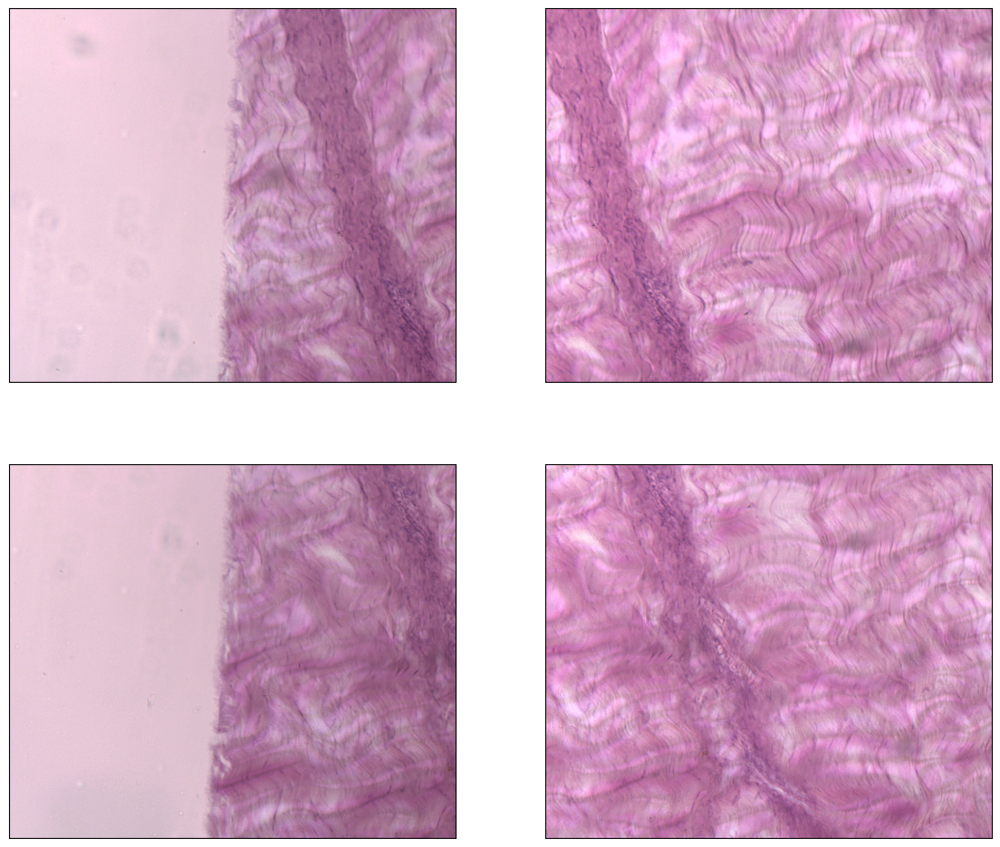

In [ ]:
# prompt: subplot 2x2 de norma_img_list[0], norma_img_list[1], norma_img_list[2], norma_img_list[3]

import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(14,12))

axs[0, 0].imshow(cv2.cvtColor(cv2.imread(norma_img_list[36]), cv2.COLOR_BGR2RGB))
axs[0, 0].set_title('')

axs[0, 1].imshow(cv2.cvtColor(cv2.imread(norma_img_list[21]), cv2.COLOR_BGR2RGB))
axs[0, 1].set_title('')

axs[1, 0].imshow(cv2.cvtColor(cv2.imread(norma_img_list[35]), cv2.COLOR_BGR2RGB))
axs[1, 0].set_title('')

axs[1, 1].imshow(cv2.cvtColor(cv2.imread(norma_img_list[22]), cv2.COLOR_BGR2RGB))
axs[1, 1].set_title('')

for ax in axs.flat:
  ax.set(xticks=[], yticks=[])

plt.show()

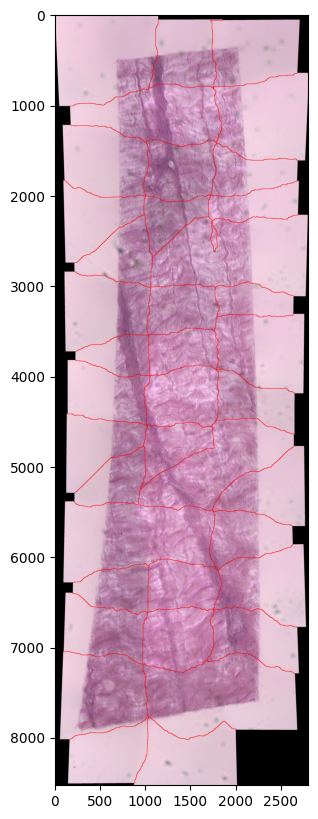

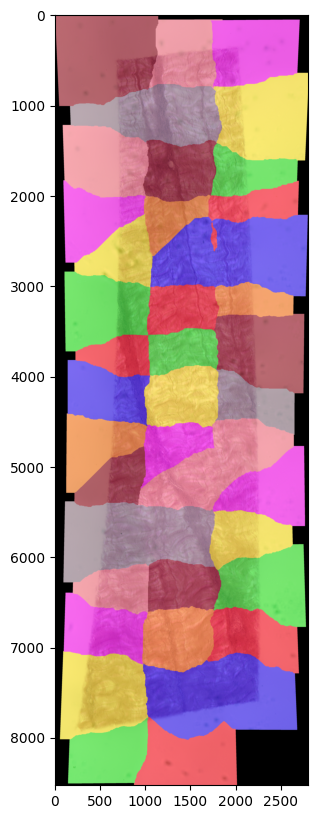

In [ ]:
#Entrenamiento con Norma
cameras, indices, images, medium_imgs, low_imgs, final_imgs = pre_mueller_comp(norma_img_list, stitching_config, train=True, plots = True)
panoramic = composePanoramic(cameras, images, medium_imgs, low_imgs, final_imgs, crop=False, plots = True)

In [ ]:
#Indices
indices_matriz = [(i, j) for i in range(3) for j in range(3)]

#Primer componente
i,j = 1,1
mueller_dataset_img, mueller_img_list = create_mueller_dataset(mueller_matrix_img_list, component=3*i+j+1)
images, medium_imgs, low_imgs, final_imgs = pre_mueller_comp(mueller_img_list, stitching_config, indices = indices, train=False)
panoramic = composePanoramic(cameras, images, medium_imgs, low_imgs, final_imgs, crop = False)

#Stitched
Stitched_Mueller = np.zeros((panoramic.shape[0],panoramic.shape[1],3,3,3), dtype = np.uint8)

#Componente (1,1)
Stitched_Mueller[:,:,:,i,j] = panoramic

#Eliminar componentes
indices_matriz.remove((1,1))

#Componentes restantes
for i, j in indices_matriz:
  mueller_dataset_img, mueller_img_list = create_mueller_dataset(mueller_matrix_img_list, component=3*i+j+1)
  images, medium_imgs, low_imgs, final_imgs = pre_mueller_comp(mueller_img_list, stitching_config, indices = indices, train=False)
  panoramic = composePanoramic(cameras, images, medium_imgs, low_imgs, final_imgs, crop = False)
  Stitched_Mueller[:,:,:,i,j] = panoramic

1040 870
1040 870
1040 870
1040 870
1040 870
1040 870
1040 870
1040 870
1040 870


In [ ]:
#Stitching
cameras, indices, images, medium_imgs, low_imgs, final_imgs = pre_mueller_comp(intensidad_img_list, stitching_config, train=True, plots = True)
panoramic = composePanoramic(cameras, images, medium_imgs, low_imgs, final_imgs, crop=False, plots = True)

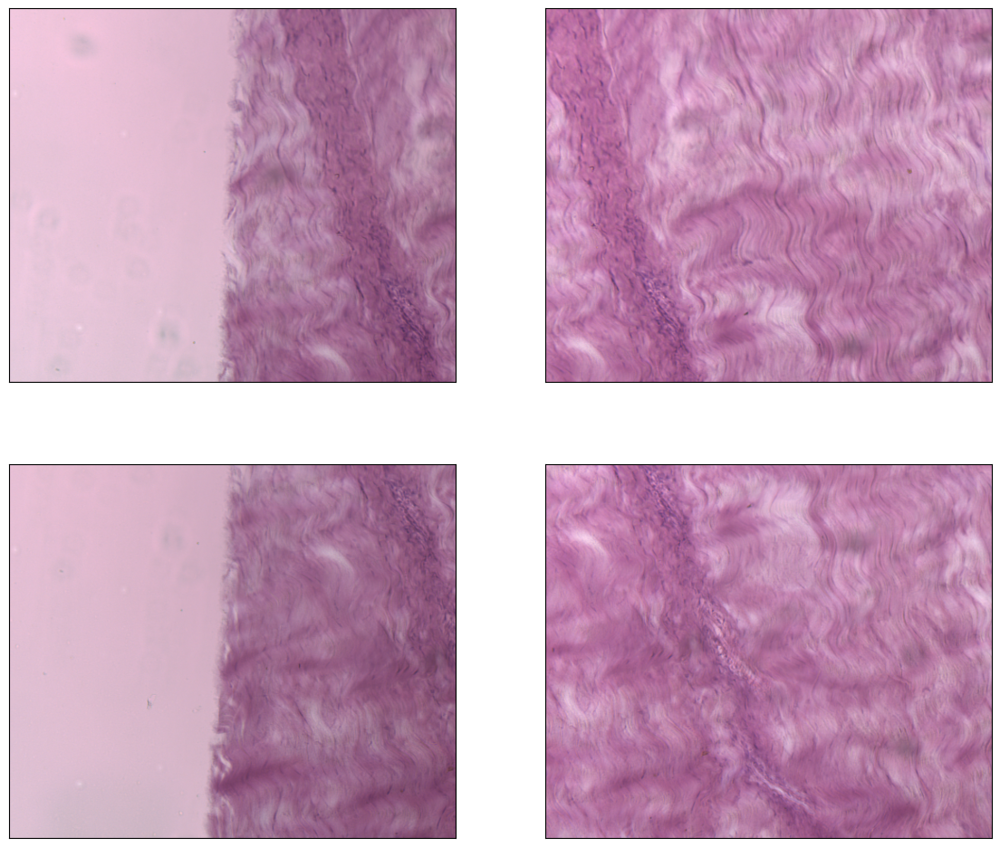

In [ ]:
# prompt: subplot 2x2 de norma_img_list[0], norma_img_list[1], norma_img_list[2], norma_img_list[3]

import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(14,12))

axs[0, 0].imshow(cv2.cvtColor(cv2.imread(intensidad_img_list[36]), cv2.COLOR_BGR2RGB))
axs[0, 0].set_title('')

axs[0, 1].imshow(cv2.cvtColor(cv2.imread(intensidad_img_list[21]), cv2.COLOR_BGR2RGB))
axs[0, 1].set_title('')

axs[1, 0].imshow(cv2.cvtColor(cv2.imread(intensidad_img_list[35]), cv2.COLOR_BGR2RGB))
axs[1, 0].set_title('')

axs[1, 1].imshow(cv2.cvtColor(cv2.imread(intensidad_img_list[22]), cv2.COLOR_BGR2RGB))
axs[1, 1].set_title('')

for ax in axs.flat:
  ax.set(xticks=[], yticks=[])

plt.show()


### Transmittance

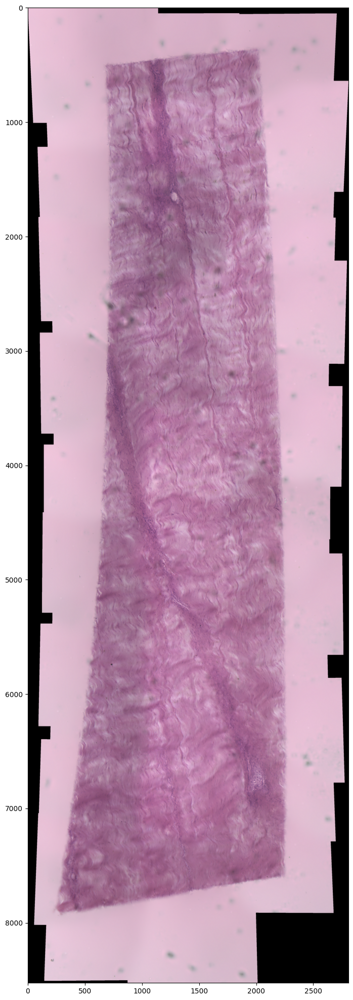

In [ ]:
#Figura
plt.figure(figsize=(25,25))
plt.imshow(cv2.cvtColor(panoramic,cv2.COLOR_BGR2RGB))

### Cropped Transmittance

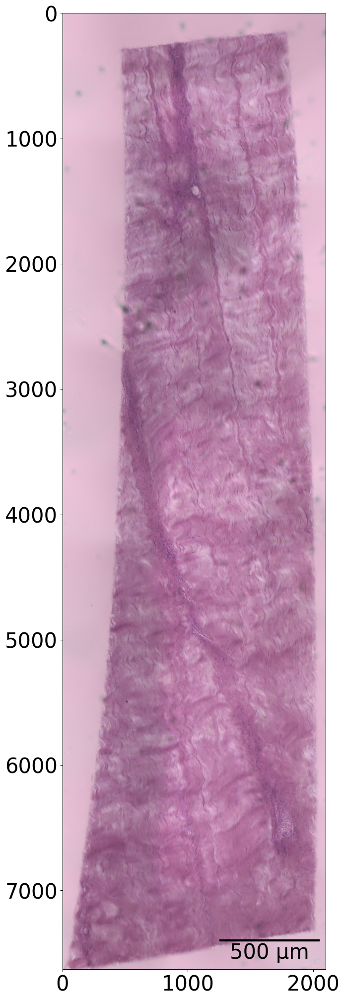

In [ ]:
#Crea Figure
fig = plt.figure(figsize=(25,25))

#Crea ejes
ax = fig.add_subplot()

#Muestra la imagen
im = ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)[200:7830,200:2300,:],cmap='jet')

#Titulo
ax.set_title('', fontsize = 20)

#Barra
scalebar = AnchoredSizeBar(ax.transData, 0.5*11*500/3.45 , '500 μm', 'lower right', pad=0.2,
                            color='black', frameon=False, size_vertical=10,
                            fontproperties=fm.FontProperties(size=30))

ax.add_artist(scalebar)

mpl.rcParams['xtick.labelsize'] = 30
mpl.rcParams['ytick.labelsize'] = 30
mpl.rcParams['axes.labelsize'] = 30


### Mueller Whole Slide Imaging

In [ ]:
# Acoplar Mueller en una imagen
M_show_B = acoplar_mueller_canal(Stitched_Mueller[200:7830,200:2300,0,:,:])
M_show_G = acoplar_mueller_canal(Stitched_Mueller[200:7830,200:2300,1,:,:])
M_show_R = acoplar_mueller_canal(Stitched_Mueller[200:7830,200:2300,2,:,:])
M_show = np.stack((M_show_B, M_show_G, M_show_R), axis=2)

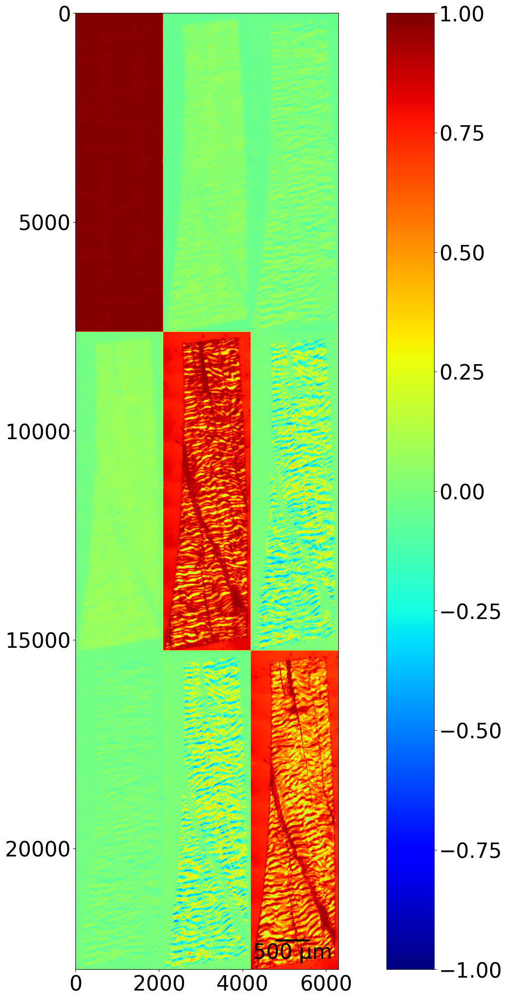

In [ ]:
#Crea Figure
fig = plt.figure(figsize=(25,25))

#Crea ejes
ax = fig.add_subplot()

#Muestra la imagen
im = ax.imshow(analogizar(M_show[:,:,1],'M8'),cmap='jet',vmin=-1,vmax=1)

#Titulo
ax.set_title('', fontsize = 20)

#Barra
scalebar = AnchoredSizeBar(ax.transData, 0.5*11*500/3.45 , '500 μm', 'lower right', pad=0.2,
                            color='black', frameon=False, size_vertical=30,
                            fontproperties=fm.FontProperties(size=30))

ax.add_artist(scalebar)


mpl.rcParams['xtick.labelsize'] = 30
mpl.rcParams['ytick.labelsize'] = 30
mpl.rcParams['axes.labelsize'] = 30

#Limites de la barra
cbar = plt.colorbar(im)
cbar.ax.tick_params(labelsize=30)

im.set_clim(vmin=-1,vmax=1)

# Calidad

In [ ]:
stitching_config = {
    'medium_megapix': 0.6,
    'low_megapix': 0.1,
    'final_megapix': -1,
    'detector': 'sift',
    'nfeatures': 5000,
    'confidence_threshold': 0.9,
    }

In [ ]:
# Lista de imágenes de intensidad
intensidad_images = []
for i in range(15, 27):
    filename = f"/content/drive/MyDrive/DATASET/DenseConnective/intensidad/{i}_intensidad.png"
    if os.path.exists(filename):
        intensidad_images.append(filename)

# Lista de imágenes de norma infinito
norma_images = []
for i in range(15, 27):
    filename = f"/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/normaInfDesnorm/{i}.png"
    if os.path.exists(filename):
        norma_images.append(filename)

print("Imágenes de intensidad:")
print(intensidad_images)

print("\nImágenes de norma infinito:")
print(norma_images)


Imágenes de intensidad:
['/content/drive/MyDrive/DATASET/DenseConnective/intensidad/15_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/intensidad/16_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/intensidad/17_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/intensidad/18_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/intensidad/19_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/intensidad/20_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/intensidad/21_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/intensidad/22_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/intensidad/23_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/intensidad/24_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/intensidad/25_intensidad.png', '/content/drive/MyDrive/DATASET/DenseConnective/intensidad/26_intensidad.png']

Imágenes de norma infinito

##  Itera sobre Grountruth

In [ ]:
# prompt: Iterate over a vector of overlap values from 0.1 to 1, cropping the input image  with the current overlap, stitching them and then comparing the result with compare_image.

import matplotlib.pyplot as plt
import numpy as np

overlap_values = np.linspace(0.1,0.4,13)

lista_intensidad = intensidad_images[:3]+intensidad_images[4:11]
lista_norma = norma_images[:3]+norma_images[4:11]

mse_results_intensidad = np.zeros((len(overlap_values),len(intensidad_images)))
ssim_results_intensidad = np.zeros((len(overlap_values),len(intensidad_images)))
nrmse_results_intensidad = np.zeros((len(overlap_values),len(intensidad_images)))

mse_results_norma = np.zeros((len(overlap_values),len(intensidad_images)))
ssim_results_norma = np.zeros((len(overlap_values),len(intensidad_images)))
nrmse_results_norma = np.zeros((len(overlap_values),len(intensidad_images)))

for j, (ruta_img_intensidad, ruta_img_norm) in enumerate(zip(lista_intensidad,lista_norma)):

  print('Ruta de imagen actual: ',ruta_img_intensidad)

  configs = {
    'intensidad': {
        'path_to_img': ruta_img_intensidad,
        'split_width': 612,
        'split_height': 512,
        'output_path': "/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/CropIntensidad",
    },
    'norm': {
        'path_to_img': ruta_img_norm,
        'split_width': 612,
        'split_height': 512,
        'output_path': "/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/CropNorma",
    }
  }
  for i, overlap in enumerate(reversed(overlap_values)):

    cropped_intensidad = []

    for  config_name, config in configs.items():

      print(f"Corriendo {config_name} con overlap {overlap}")

      # Crop the image
      cropped_images = split_image_modified(config['path_to_img'], config['split_width'], config['split_height'], config['output_path'], overlap)

      # Stitch the images
      if config_name == 'intensidad':

        try:
          cropped_intensidad = cropped_images
          cameras, indices, images, medium_imgs, low_imgs, final_imgs = pre_mueller_comp(cropped_images, stitching_config, train=True)
          panoramic = composePanoramic(cameras, images, medium_imgs, low_imgs, final_imgs, crop = False)

          # Compare the stitched image with the original
          mse_value, ssim_value, nrmse_value = compare_images(cv2.imread(ruta_img_intensidad), panoramic, plots = False)

          print(f"MSE: {mse_value}")
          print(f"NRMSE: {nrmse_value}")
          print(f"SSIM: {ssim_value}")

          # Store the results
          mse_results_intensidad[i,j] = mse_value
          ssim_results_intensidad[i,j] = ssim_value
          nrmse_results_intensidad[i,j] = nrmse_value

        except:
          print("Error en el stitching, continúa")

          mse_results_intensidad[i,j] = None
          ssim_results_intensidad[i,j] = None
          nrmse_results_intensidad[i,j] = None

      else:

        try:
          cameras, indices, images, medium_imgs, low_imgs, final_imgs = pre_mueller_comp(cropped_images, stitching_config, train=True)
          images, medium_imgs, low_imgs, final_imgs = pre_mueller_comp(cropped_intensidad, stitching_config, indices = indices, train=False)
          panoramic = composePanoramic(cameras, images, medium_imgs, low_imgs, final_imgs, crop = False)

          # Compare the stitched image with the original
          mse_value, ssim_value, nrmse_value = compare_images(cv2.imread(ruta_img_intensidad), panoramic, plots = False)

          print(f"MSE: {mse_value}")
          print(f"NRMSE: {nrmse_value}")
          print(f"SSIM: {ssim_value}")

          # Store the results
          mse_results_norma[i,j] = mse_value
          ssim_results_norma[i,j] = ssim_value
          nrmse_results_norma[i,j] = nrmse_value

        except:
          print("Error en el stitching, continúa")

          mse_results_norma[i,j] = None
          ssim_results_norma[i,j] = None
          nrmse_results_norma[i,j] = None

Ruta de imagen actual:  /content/drive/MyDrive/DATASET/DenseConnective/intensidad/15_intensidad.png
Corriendo intensidad con overlap 0.4
1124
1344
Cantidad de imágenes: 9


/usr/local/lib/python3.10/dist-packages/stitching/seam_finder.py:100: StitchingWarning: Without additional colors,
            there will be seam masks with identical colors
  warnings.warn(


MSE: 39.4403626685049
NRMSE: 0.041937965277703826
SSIM: 0.8433521187721448
Corriendo norm con overlap 0.4
1124
1344
Cantidad de imágenes: 9
MSE: 13.127739800347221
NRMSE: 0.024187441684502882
SSIM: 0.9446420881020543
Corriendo intensidad con overlap 0.3750000000000001
1150
1375
Cantidad de imágenes: 9
MSE: 8.781787747651144
NRMSE: 0.019780061686175774
SSIM: 0.9669097632624102
Corriendo norm con overlap 0.3750000000000001
1150
1375
Cantidad de imágenes: 9
MSE: 103.37988600388071
NRMSE: 0.06806809283759895
SSIM: 0.7596633254156792
Corriendo intensidad con overlap 0.3500000000000001
1175
1405
Cantidad de imágenes: 9
MSE: 34.210189121221404
NRMSE: 0.039143388422104734
SSIM: 0.8629456088781353
Corriendo norm con overlap 0.3500000000000001
1175
1405
Cantidad de imágenes: 9
MSE: 19.52020143995098
NRMSE: 0.029561557991207053
SSIM: 0.9280757777281291
Corriendo intensidad con overlap 0.32500000000000007
1201
1436
Cantidad de imágenes: 9
MSE: 13.74832292943219
NRMSE: 0.024806390939935703
SSIM: 0.

/usr/local/lib/python3.10/dist-packages/skimage/metrics/simple_metrics.py:109: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(mean_squared_error(image_true, image_test)) / denom


MSE: 17718.29994989532
NRMSE: inf
SSIM: 0.0003040923773656729
Corriendo norm con overlap 0.22500000000000003
1303
1558
Cantidad de imágenes: 9
MSE: 14.470383189082925
NRMSE: 0.02897641837899253
SSIM: 0.9468456187706256
Corriendo intensidad con overlap 0.2
1329
1589
Cantidad de imágenes: 9
MSE: 17694.09697249668
NRMSE: 25.633593218565814
SSIM: 0.000363669366477288
Corriendo norm con overlap 0.2
1329
1589
Cantidad de imágenes: 9
MSE: 1205.8153171913298
NRMSE: 0.2745361094461571
SSIM: 0.8253103099130097
Corriendo intensidad con overlap 0.17500000000000002
1354
1619
Cantidad de imágenes: 9
Error en el stitching, continúa
Corriendo norm con overlap 0.17500000000000002
1354
1619
Cantidad de imágenes: 9
MSE: 1465.4529319214664
NRMSE: 0.30032991693180305
SSIM: 0.7669278821216396
Corriendo intensidad con overlap 0.15000000000000002
1380
1650
Cantidad de imágenes: 9
Error en el stitching, continúa
Corriendo norm con overlap 0.15000000000000002
1380
1650
Cantidad de imágenes: 9
Error en el stitch

### Guardar

In [ ]:
# prompt: guardar mse_results_intensidad,   ssim_results_intensidad[ y nrmse_results_intensidad

import pickle

with open('mse_results_intensidad2.pickle', 'wb') as f:
  pickle.dump(mse_results_intensidad, f)

with open('ssim_results_intensidad2.pickle', 'wb') as f:
  pickle.dump(ssim_results_intensidad, f)

with open('nrmse_results_intensidad2.pickle', 'wb') as f:
  pickle.dump(nrmse_results_intensidad, f)

with open('mse_results_norma2.pickle', 'wb') as f:
  pickle.dump(mse_results_norma, f)

with open('ssim_results_norma2.pickle', 'wb') as f:
  pickle.dump(ssim_results_norma, f)

with open('nrmse_results_norma2.pickle', 'wb') as f:
  pickle.dump(nrmse_results_norma, f)



### Cargar

In [ ]:

with open('ssim_results_intensidad2.pickle', 'rb') as f:
    ssim_results_intensidad = pickle.load(f)

with open('nrmse_results_intensidad2.pickle', 'rb') as f:
    nrmse_results_intensidad = pickle.load(f)

with open('mse_results_norma2.pickle', 'rb') as f:
    mse_results_norma = pickle.load(f)

with open('ssim_results_norma2.pickle', 'rb') as f:
    ssim_results_norma = pickle.load(f)

with open('nrmse_results_norma2.pickle', 'rb') as f:
    nrmse_results_norma = pickle.load(f)

overlap_values = np.linspace(0.1,0.4,11)

### Proporciones

In [ ]:
proporciones_intensidad = []
proporciones_norma = []

for i in range(ssim_results_intensidad.shape[0]):
  no_nans_intensidad = np.count_nonzero(~np.isnan(ssim_results_intensidad[i,:10]))
  nans_intensidad = np.count_nonzero(np.isnan(ssim_results_intensidad[i,:10]))
  total_intensidad = no_nans_intensidad + nans_intensidad
  proporciones_intensidad.append(no_nans_intensidad / total_intensidad if total_intensidad > 0 else 0)

  no_nans_norma = np.count_nonzero(~np.isnan(ssim_results_norma[i,:10]))
  nans_norma = np.count_nonzero(np.isnan(ssim_results_norma[i,:10]))
  total_norma = no_nans_norma + nans_norma
  proporciones_norma.append(no_nans_norma / total_norma if total_norma > 0 else 0)

print("Proporciones de no NaN a NaN para Intensidad:", proporciones_intensidad)
print("Proporciones de no NaN a NaN para Norma:", proporciones_norma)


Proporciones de no NaN a NaN para Intensidad: [0.9, 0.9, 0.7, 0.6, 0.5, 0.6, 0.6, 0.6, 0.6, 0.4, 0.5, 0.5, 0.5]
Proporciones de no NaN a NaN para Norma: [1.0, 1.0, 1.0, 1.0, 0.9, 1.0, 0.7, 0.8, 0.7, 0.6, 0.3, 0.4, 0.4]


### Crop ejemplo

1124
1344
Cantidad de imágenes: 9


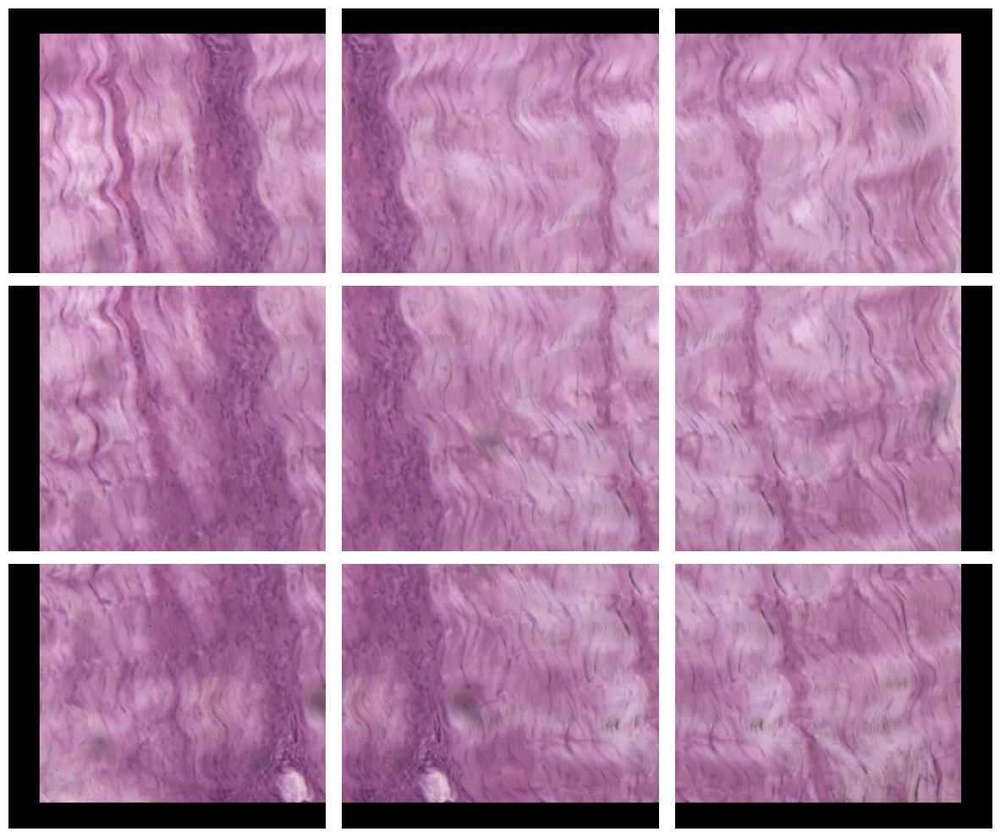

In [ ]:
# Crop ejemplo
cropped_images = split_image_modified(intensidad_images[0],612, 512,"/content/drive/MyDrive/Stitching Ultimate/StitchingPaper/EligiendoNorma/CropIntensidad", 0.4)

# Assuming 'cropped_images' is a list of images
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12, 10))  # Adjust nrows, ncols as needed

for i, ax in enumerate(axes.flat):
    if i < len(cropped_images):
        ax.imshow(cv2.cvtColor(cropped_images[i], cv2.COLOR_BGR2RGB))
        ax.axis('off')
    else:
        ax.axis('off')  # Hide unused subplots

plt.tight_layout()
plt.show()

### Resultado Calidad

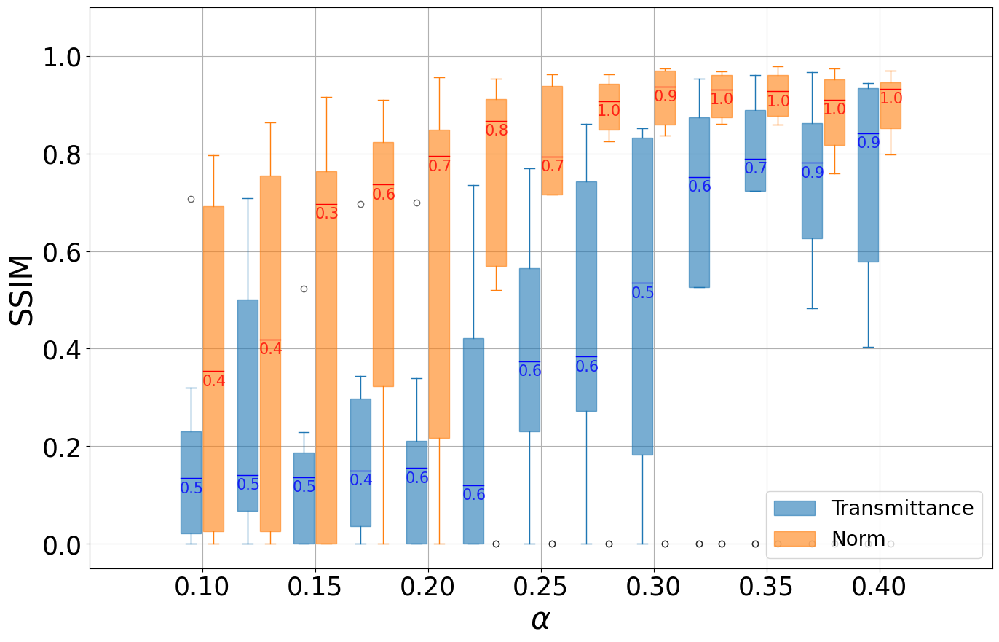

In [ ]:
plt.figure(figsize=(16, 10))

# Definir el desplazamiento para separar los boxplots
offset = 0.005

bp1 = []  # Para almacenar los boxplots de intensidad
# Crear los boxplots para cada fila de la matriz ssim_results_intensidad
for i in range(len(overlap_values)):
    # Eliminar NaN de los datos de la fila antes de graficar (intensidad)
    data_intensidad = ssim_results_intensidad[i, :]
    data_intensidad_clean = data_intensidad[~np.isnan(data_intensidad)]  # Filtrar los valores NaN

    # Crear el boxplot de intensidad solo si hay datos válidos
    if len(data_intensidad_clean) > 0:
        bp1.append(plt.boxplot(data_intensidad_clean,
                                positions=[overlap_values[::-1][i] - offset],  # Desplazar un poco hacia la izquierda
                                widths=0.009,
                                patch_artist=True,
                                boxprops=dict(facecolor='#1f77b4', color='#1f77b4', alpha=0.6),
                                capprops=dict(color='#1f77b4'),
                                whiskerprops=dict(color='#1f77b4'),
                                flierprops=dict(marker='o', color='#1f77b4', alpha=0.6),
                                medianprops=dict(color='blue')))

bp2 = []  # Para almacenar los boxplots de norma
# Crear los boxplots para cada fila de la matriz ssim_results_norma
for i in range(len(overlap_values)):
    # Eliminar NaN de los datos de la fila antes de graficar (norma)
    data_norma = ssim_results_norma[i, :]
    data_norma_clean = data_norma[~np.isnan(data_norma)]  # Filtrar los valores NaN

    # Crear el boxplot de norma solo si hay datos válidos
    if len(data_norma_clean) > 0:
        bp2.append(plt.boxplot(data_norma_clean,
                                positions=[overlap_values[::-1][i] + offset],  # Desplazar un poco hacia la derecha
                                widths=0.009,
                                patch_artist=True,
                                boxprops=dict(facecolor='#ff7f0e', color='#ff7f0e', alpha=0.6),
                                capprops=dict(color='#ff7f0e'),
                                whiskerprops=dict(color='#ff7f0e'),
                                flierprops=dict(marker='o', color='#ff7f0e', alpha=0.6),
                                medianprops=dict(color='red')))

# Calcular medianas
medianas_intensidad = np.nanmedian(ssim_results_intensidad, axis=1)
medianas_norma = np.nanmedian(ssim_results_norma, axis=1)

# Agregar los números al lado de los cuadrados para la lista de proporciones_intensidad
for i, value in enumerate(proporciones_intensidad):
    plt.text(overlap_values[::-1][i]-0.01, medianas_intensidad[i]-0.03, f'{value}', fontsize=15, ha='left', color='blue', alpha=0.8)

# Agregar los números al lado de los cuadrados para la lista de proporciones_norma
for i, value in enumerate(proporciones_norma):
    plt.text(overlap_values[::-1][i]-0.0, medianas_norma[i]-0.03, f'{value}', fontsize=15, ha='left', color='red', alpha=0.8)

# Crear líneas de referencia para la leyenda
plt.plot([], [], color='#ff7f0e', label='Norm', linewidth=5)  # Línea naranja para Norm
plt.plot([], [], color='#1f77b4', label='Transmittance', linewidth=5)  # Línea azul para Transmittance

# Configurar los xticks para mostrar 2 decimales
plt.xticks(overlap_values[::-1][::2], [f'{x:.2f}' for x in overlap_values[::-1][::2]], fontsize=25)

# Configurar etiquetas y estilo del gráfico
plt.xlabel(r'$\alpha$', fontsize=30)
plt.ylabel('SSIM', fontsize=30)
plt.title('', fontsize=20)
plt.xlim([min(overlap_values) - 0.05, max(overlap_values) + 0.05])
plt.ylim([-0.05, 1.1])
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)

# Agregar la leyenda
plt.legend([bp1[0]["boxes"][0], bp2[0]["boxes"][0]], ['Transmittance', 'Norm'], loc='lower right', fontsize=20)

# Mostrar el gráfico
plt.grid()
plt.show()
